### Imports

In [1]:
import pickle as pkl
import pandas as pd
import numpy as np
import json
import os
import torch.optim as optim
import shap
from matplotlib import pyplot as plt
from time import time
from torch.autograd import Variable
from sklearn.cluster import KMeans

#### Import model definitions

In [2]:
# %load /home/ninow/master_thesis/code/project/model/Baseline.py
import torch
import torch.nn as nn
import torch.nn.functional as F
import sys


class AbstractNetwork(nn.Module):
    n_station_features = 3
    n_time_features = 5

    def num_flat_features(self, x):
        size = x.size()[1:]  # all dimensions except the batch dimension
        num_features = 1
        for s in size:
            num_features *= s
        return num_features

    def getNumberOfAdditionalFeatures(self, useSTI, useTimeData):
        return (self.n_station_features if useSTI else 0) + (self.n_time_features if useTimeData else 0)

    def getAdditionaFeatureHandling(self, useSTI, useTimeData):
        if useSTI and useTimeData:
            return lambda x, time_features, station_data: torch.cat((x, time_features, station_data), 1)
        elif useSTI:
            return lambda x, _, station_data: torch.cat((x, station_data), 1)
        elif useTimeData:
            return lambda x, time_features, _: torch.cat((x, time_features), 1)
        else:
            return lambda x, *_: x


class CNN(AbstractNetwork):
    def conv_out_size(self, grid_in, grid_conv, stride):
        return int((grid_in - grid_conv) / stride + 1)


class CNN0L(CNN):
    def __init__(self, filter_conv1, grid_conv1, stride, n_parameters, n_time_invariant_parameters, n_grid,
                 useSTI, useTimeData, prediction_times):
        super(CNN0L, self).__init__()
        self.prediciton_times = prediction_times
        self.n_predictions = len(prediction_times)
        self.conv1 = nn.Conv2d(n_parameters + 1 + n_time_invariant_parameters, filter_conv1, grid_conv1)
        self.addNonGridFeatures = self.getAdditionaFeatureHandling(useSTI, useTimeData)
        self.fc1 = nn.Linear(
            filter_conv1 * (self.conv_out_size(n_grid, grid_conv1, stride) ** 2) + self.getNumberOfAdditionalFeatures(
                useSTI, useTimeData), self.n_predictions)

    def forward(self, x, time_features, station_features):
        x = F.relu(self.conv1(x))
        x = x.view(-1, self.num_flat_features(x))
        x = self.addNonGridFeatures(x, time_features, station_features)
        x = self.fc1(x)
        return x


class CNN1L(CNN0L):
    def __init__(self, filter_conv1, grid_conv1, stride, n_fc1, n_parameters, n_time_invariant_parameters, n_grid,
                 useSTI, useTimeData, prediction_times):
        super(CNN1L, self).__init__(filter_conv1, grid_conv1, stride, n_parameters, n_time_invariant_parameters,
                                    n_grid, useSTI, useTimeData, prediction_times)
        self.fc1 = nn.Linear(
            filter_conv1 * (self.conv_out_size(n_grid, grid_conv1, stride) ** 2) + self.getNumberOfAdditionalFeatures(
                useSTI, useTimeData), n_fc1)
        self.fc2 = nn.Linear(n_fc1, self.n_predictions)

    def forward(self, x, time_features, station_features):
        x = F.relu(super(CNN1L, self).forward(x, time_features, station_features))
        x = self.fc2(x)
        return x


class CNN2L(CNN1L):
    def __init__(self, filter_conv1, grid_conv1, stride, n_fc1, n_fc2, n_parameters, n_time_invariant_parameters,
                 n_grid,
                 useSTI, useTimeData, prediction_times):
        super(CNN2L, self).__init__(filter_conv1, grid_conv1, stride, n_fc1, n_parameters,
                                    n_time_invariant_parameters, n_grid,
                                    useSTI, useTimeData, prediction_times)
        self.fc2 = nn.Linear(n_fc1, n_fc2)
        self.fc3 = nn.Linear(n_fc2, self.n_predictions)

    def forward(self, x, time_features, station_features):
        x = F.relu(super(CNN2L, self).forward(x, time_features, station_features))
        x = self.fc3(x)
        return x


class FullyConnected1L(AbstractNetwork):
    def __init__(self, n_fc1, n_parameters, n_time_invariant_parameters, n_grid, useSTI, useTimeData, prediction_times):
        super(FullyConnected1L, self).__init__()
        self.prediciton_times = prediction_times
        self.n_predictions = len(prediction_times)
        # n_parameters: features of cosmo grid depending on lead time, 1: temperature of lead time = 0,
        # n_time_invariant_parameters: time invariant grid features such as soil type, fraction of land, height diff.
        # to station, etc.
        self.fc1 = nn.Linear((n_parameters + 1 + n_time_invariant_parameters) * (n_grid ** 2) + self.getNumberOfAdditionalFeatures(useSTI, useTimeData), n_fc1)
        self.addNonGridFeatures = self.getAdditionaFeatureHandling(useSTI, useTimeData)
        self.fc2 = nn.Linear(n_fc1, self.n_predictions)

    def forward(self, x, time_features, station_features):
        x = x.view(-1, self.num_flat_features(x))
        x = self.addNonGridFeatures(x, time_features, station_features)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x


class FullyConnected2L(FullyConnected1L):
    def __init__(self, n_fc1, n_fc2, n_parameters, n_time_invariant_parameters, n_grid, useSTI,
                 useTimeData, prediction_times):
        super(FullyConnected2L, self).__init__(n_fc1, n_parameters, n_time_invariant_parameters, n_grid,
                                               useSTI, useTimeData, prediction_times)
        self.fc2 = nn.Linear(n_fc1 + self.getNumberOfAdditionalFeatures(useSTI, useTimeData), n_fc2)
        self.fc3 = nn.Linear(n_fc2, self.n_predictions)

    def forward(self, x, time_features, station_features):
        x = F.relu(super(FullyConnected2L, self).forward(x, time_features, station_features))
        x = self.fc3(x)
        return x


class FullyConnected3L(FullyConnected2L):
    def __init__(self, n_fc1, n_fc2, n_fc3, n_parameters, n_time_invariant_parameters, n_grid, useSTI,
                 useTimeData, prediction_times):
        super(FullyConnected3L, self).__init__(n_fc1, n_fc2, n_parameters, n_time_invariant_parameters, n_grid,
                                               useSTI, useTimeData, prediction_times)
        self.fc3 = nn.Linear(n_fc2, n_fc3)
        self.fc4 = nn.Linear(n_fc3, self.n_predictions)

    def forward(self, x, time_features, station_features):
        x = F.relu(super(FullyConnected3L, self).forward(x, time_features, station_features))
        x = self.fc4(x)
        return x

class FullyConnectedSingleGrid1L(AbstractNetwork):
    def __init__(self, n_fc1, n_parameters, n_time_invariant_parameters, useSTI, useTimeData, prediction_times, n_points=1, droupout_prob=0):
        super(FullyConnectedSingleGrid1L, self).__init__()
        self.prediciton_times = prediction_times
        self.n_predictions = len(prediction_times)
        # n_parameters: features of cosmo grid depending on lead time, 1: temperature of lead time = 0,
        # n_time_invariant_parameters: time invariant grid features such as soil type, fraction of land, height diff.
        # to station, etc.
        self.addNonGridFeatures = self.getAdditionaFeatureHandling(useSTI, useTimeData)
        self.fc1 = nn.Linear(((n_parameters + 1 + n_time_invariant_parameters) * n_points + self.getNumberOfAdditionalFeatures(useSTI, useTimeData)), n_fc1)
        self.fc2 = nn.Linear(n_fc1, self.n_predictions)
        self.dropout1 = nn.Dropout(p=droupout_prob)
        print('Model uses dropout probability: %s' % droupout_prob)

    def forward(self, x, time_features, station_features):
        try:
            # this awkward squeezing is necessary because we got problems, when the batch is randomly 1 (due to not
            # dividable training or test set size by the batch size)
            x = self.addNonGridFeatures(x.squeeze(dim=-1).squeeze(dim=-1), time_features, station_features)
        except RuntimeError:
            sys.stderr.write("Shapes X, time_features, station_features: " + str(x.shape) + str(time_features.shape) + str(station_features.shape))
            sys.stderr.write("X: " + str(x))
            sys.stderr.write("time_features: ", time_features)
            sys.stderr.write("station_features: ", station_features)
            raise

        x = x.view(-1, self.num_flat_features(x))
        x = F.relu(self.fc1(x))
        x = self.dropout1(x)
        x = self.fc2(x)
        return x


class FullyConnectedSingleGrid2L(FullyConnectedSingleGrid1L):
    def __init__(self, n_fc1, n_fc2, n_parameters, n_time_invariant_parameters, useSTI, useTimeData, prediction_times,n_points=1, droupout_prob=0):
        super(FullyConnectedSingleGrid2L, self).__init__(n_fc1, n_parameters, n_time_invariant_parameters,
                                               useSTI, useTimeData, prediction_times,n_points,droupout_prob=droupout_prob)
        self.fc2 = nn.Linear(n_fc1, n_fc2)
        self.fc3 = nn.Linear(n_fc2, self.n_predictions)
        self.dropout2 = nn.Dropout(p=droupout_prob)
        self.i = 0

    def forward(self, x, time_features, station_features):
        x = F.relu(super(FullyConnectedSingleGrid2L, self).forward(x, time_features, station_features))
        x = self.dropout2(x)
        x = self.fc3(x)
        self.i = self.i + 1
        return x


class FullyConnectedSingleGrid3L(FullyConnectedSingleGrid2L):
    def __init__(self, n_fc1, n_fc2, n_fc3, n_parameters, n_time_invariant_parameters, useSTI, useTimeData, prediction_times,n_points=1,droupout_prob=0):
        super(FullyConnectedSingleGrid3L, self).__init__(n_fc1, n_fc2, n_parameters, n_time_invariant_parameters,
                                               useSTI, useTimeData, prediction_times,n_points, droupout_prob=droupout_prob)
        self.fc3 = nn.Linear(n_fc2, n_fc3)
        self.fc4 = nn.Linear(n_fc3, self.n_predictions)
        self.dropout3 = nn.Dropout(p=droupout_prob)

    def forward(self, x, time_features, station_features):
        x = F.relu(super(FullyConnectedSingleGrid3L, self).forward(x, time_features, station_features))
        x = self.dropout3(x)
        x = self.fc4(x)
        return x


def model_factory(model_dict, params, time_invariant_params, grid, prediction_times):
    print(model_dict)
    # CNN
    if model_dict['type'] == 'CNN':
        if not 'fc_layers' in model_dict:
            return CNN0L(filter_conv1=model_dict['n_conv1'],
                         grid_conv1=model_dict['grid_conv1'],
                         stride=model_dict['stride'],
                         n_parameters=params,
                         n_time_invariant_parameters=time_invariant_params,
                         n_grid=grid,
                         useSTI=model_dict[
                             'station_time_invariant'] if 'station_time_invariant' in model_dict else True,
                         useTimeData=model_dict['useTimeData'] if 'useTimeData' in model_dict else True,
                         prediction_times=prediction_times)

        elif model_dict['fc_layers'] == 1:
            return CNN1L(filter_conv1=model_dict['n_conv1'],
                         grid_conv1=model_dict['grid_conv1'],
                         stride=model_dict['stride'],
                         n_fc1=model_dict['n_fc1'],
                         n_parameters=params,
                         n_time_invariant_parameters=time_invariant_params,
                         n_grid=grid,
                         useSTI=model_dict[
                             'station_time_invariant'] if 'station_time_invariant' in model_dict else True,
                         useTimeData=model_dict['useTimeData'] if 'useTimeData' in model_dict else True,
                         prediction_times=prediction_times)
        elif model_dict['fc_layers'] == 2:
            return CNN2L(filter_conv1=model_dict['n_conv1'],
                         grid_conv1=model_dict['grid_conv1'],
                         stride=model_dict['stride'],
                         n_fc1=model_dict['n_fc1'],
                         n_fc2=model_dict['n_fc2'],
                         n_parameters=params,
                         n_time_invariant_parameters=time_invariant_params,
                         n_grid=grid,
                         useSTI=model_dict[
                             'station_time_invariant'] if 'station_time_invariant' in model_dict else True,
                         useTimeData=model_dict['useTimeData'] if 'useTimeData' in model_dict else True,
                         prediction_times=prediction_times)

    # Fully connected network
    elif model_dict['type'] == 'FC':
        if grid == 1:
            if 'knn' in model_dict:
                n_points = 3
            else:
                n_points = 1
            if model_dict['fc_layers'] == 1:
                return FullyConnectedSingleGrid1L(n_fc1=model_dict['n_fc1'],
                                        n_parameters=params,
                                        n_time_invariant_parameters=time_invariant_params,
                                        useSTI=model_dict[
                                            'station_time_invariant'] if 'station_time_invariant' in model_dict else True,
                                        useTimeData=model_dict['useTimeData'] if 'useTimeData' in model_dict else True,
                                        prediction_times=prediction_times,
                                        n_points=n_points,
                                        droupout_prob=model_dict['dropout_prop'] if 'dropout_prop' in model_dict else 0)
            elif model_dict['fc_layers'] == 2:
                return FullyConnectedSingleGrid2L(n_fc1=model_dict['n_fc1'],
                                        n_fc2=model_dict['n_fc2'],
                                        n_parameters=params,
                                        n_time_invariant_parameters=time_invariant_params,
                                        useSTI=model_dict[
                                            'station_time_invariant'] if 'station_time_invariant' in model_dict else True,
                                        useTimeData=model_dict['useTimeData'] if 'useTimeData' in model_dict else True,
                                        prediction_times=prediction_times,
                                        n_points=n_points,
                                        droupout_prob=model_dict['dropout_prop'] if 'dropout_prop' in model_dict else 0)
            elif model_dict['fc_layers'] == 3:
                return FullyConnectedSingleGrid3L(n_fc1=model_dict['n_fc1'],
                                        n_fc2=model_dict['n_fc2'],
                                        n_fc3=model_dict['n_fc3'],
                                        n_parameters=params,
                                        n_time_invariant_parameters=time_invariant_params,
                                        useSTI=model_dict[
                                            'station_time_invariant'] if 'station_time_invariant' in model_dict else True,
                                        useTimeData=model_dict['useTimeData'] if 'useTimeData' in model_dict else True,
                                        prediction_times=prediction_times,
                                        n_points=n_points,
                                        droupout_prob=model_dict['dropout_prop'] if 'dropout_prop' in model_dict else 0)

        else:
            if model_dict['fc_layers'] == 1:
                return FullyConnected1L(n_fc1=model_dict['n_fc1'],
                                        n_parameters=params,
                                        n_time_invariant_parameters=time_invariant_params,
                                        n_grid=grid,
                                        useSTI=model_dict[
                                            'station_time_invariant'] if 'station_time_invariant' in model_dict else True,
                                        useTimeData=model_dict['useTimeData'] if 'useTimeData' in model_dict else True,
                                        prediction_times=prediction_times)
            elif model_dict['fc_layers'] == 2:
                return FullyConnected2L(n_fc1=model_dict['n_fc1'],
                                        n_fc2=model_dict['n_fc2'],
                                        n_parameters=params,
                                        n_time_invariant_parameters=time_invariant_params,
                                        n_grid=grid,
                                        useSTI=model_dict[
                                            'station_time_invariant'] if 'station_time_invariant' in model_dict else True,
                                        useTimeData=model_dict['useTimeData'] if 'useTimeData' in model_dict else True,
                                        prediction_times=prediction_times)
            elif model_dict['fc_layers'] == 3:
                return FullyConnected3L(n_fc1=model_dict['n_fc1'],
                                        n_fc2=model_dict['n_fc2'],
                                        n_fc3=model_dict['n_fc3'],
                                        n_parameters=params,
                                        n_time_invariant_parameters=time_invariant_params,
                                        n_grid=grid,
                                        useSTI=model_dict[
                                            'station_time_invariant'] if 'station_time_invariant' in model_dict else True,
                                        useTimeData=model_dict['useTimeData'] if 'useTimeData' in model_dict else True,
                                        prediction_times=prediction_times)

    raise Exception('No matching model found for name \"%s\"' % model_dict['name'])


In [3]:
# return a data frame with each feature (named by columns)
# and it's position in a array sorted by feature importance
def getImportanceIdxByFeature(shap_values, columns):
    # remove base value
    shap_values = shap_values[:,:-1]
    # remove Init, Station and Target
    columns = columns[2:-1]
    sum_absolute_inportance_per_feature = np.sum(np.absolute(shap_values),axis=0)
    position_array = np.zeros((30,))
    for idx, pos in list(zip(np.argsort(sum_absolute_inportance_per_feature)[::-1], np.arange(0,30))):
        position_array[idx] = pos
    return pd.DataFrame(data=position_array[None,...], columns=columns, dtype=int)

# return a data frame with the absolute importance per feature
def getMeanAbsoluteImportanceByFeature(shap_values, columns):
    # remove base value
    shap_values = shap_values[:,:-1]
    # remove Init, Station and Target
    columns = columns[2:-1]
    sum_absolute_inportance_per_feature = np.mean(np.absolute(shap_values),axis=0)
    return pd.DataFrame(data=sum_absolute_inportance_per_feature[None,...], columns=columns, dtype=float)

In [4]:
# print the JS visualization code to the notebook
shap.initjs()

### Get input data

In [5]:
config = pkl.load(open('/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/knn_1/shap/config.pkl', 'rb'))
config['experiment_path'] = '/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/error_label'
model = config['model']
model['path'] = '/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/error_label/models/FC_L3_1024_256_64_TD_GTI_STI.txt'
config['model'] = model
config['trained_model_output_path'] = '/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/error_label/FC_L3_1024_256_64_TD_GTI_STI_grid_1_bs_64_tf_0.1_optim_sgd_lr_0.0005_sl_24/'

In [6]:
train_data = pd.read_pickle('/mnt/ds3lab-scratch/ninow/preprocessed_data/network_ready_data/train_data')
test_data = pd.read_pickle('/mnt/ds3lab-scratch/ninow/preprocessed_data/network_ready_data/test_data')

In [7]:
column_names = train_data.columns

In [8]:
column_names = ['Init', 'Station', 'Pressure', 'Wind U-Comp.', 'Wind V-Comp.',
       'Wind VMAX', '2m-Temperature', 'Temp. of Dew Point',
       'Cloud Coverage (High)', 'Cloud Coverage (Medium)',
       'Cloud Coverage (Low)', 'Tot. Precipitation', 'ALB_RAD', 'ASAB', 'ATHB',
       'HPBL', '2m-Temperature (Lead=0)', 'Grid Height',
       'Grid-Station Height Diff.', 'Fraction of Land', 'Soiltype',
       'Latitiude', 'Longitued', 'Grid-Station 2d Distance', 'Station Height',
       'Station Latitude', 'Station Longitude', 'Hour (Cosine)', 'Hour (Sine)',
       'Month (Cosine)', 'Month (Sine)', 'Lead-Time', 'Target 2m-Temp.']

In [9]:
# load station positions to plot them on map
station_data = pkl.load(open('/mnt/ds3lab-scratch/ninow/preprocessed_data/station/grid_size_1/time_invariant_data_per_station.pkl','rb'))
station_positions = station_data.station_position.sel(positinal_attribute = ['rlat', 'rlon','height_raw'])
stations = station_data.station
station_names = station_data.station_name

station_idx_mapping = {}
for s_idx, s in enumerate(stations.data):
    station_idx_mapping[s] = s_idx

In [16]:
# complete grid data for 19.06.2016 03:00
with open('/home/ninow/master_thesis/code/project/results/feature_interpretation/complete_674_1058_preprocessed_grid_data_flat.pkl', 'rb') as handle:
    complete_grid_data = pkl.load(handle)
# create pandas data frame
complete_grid_data_set = pd.DataFrame(data=complete_grid_data, columns=train_data.columns[2:-1])

## Define wrapper to use pytorch NN

In [10]:
def network_output_wrapper(net, X):
    grid_data = getVariable(torch.Tensor(X[:,:22])).float()
    if X.shape[1] >= 30:
        station_time_inv_input = getVariable(torch.Tensor(X[:,22:25])).float()
    else:
        station_time_inv_input = None
    time_data = getVariable(torch.Tensor(X[:,-5:])).float()
    return net(grid_data, time_data, station_time_inv_input).data.cpu().numpy()

# wrapper for pytorch network output
f = lambda X: network_output_wrapper(net=net, X=X)

In [11]:
def getVariable(tensor):
    if torch.cuda.is_available():
        input = Variable(tensor.cuda())
    else:
        input = Variable(tensor)
    return input

In [12]:
def load_checkpoint(path, model, optimizer):
    file_path = path + '/model_best.pth.tar'
    if os.path.isfile(file_path):
        print("Loading checkpoint from: %s" % file_path)
        checkpoint = torch.load(file_path)
        epoch = checkpoint['epoch'] + 1
        best_epoch_test_rmse = checkpoint['best_epoch_test_rmse']
        model.load_state_dict(checkpoint['state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer'])
        print("Loaded checkpoint with best test rmse %s (epoch %s)" % (best_epoch_test_rmse, checkpoint['epoch']))
    else:
        raise Exception("No checkpoint found at %s" % file_path)
    return model, optimizer, epoch, best_epoch_test_rmse

## Load trained network

In [13]:
# assign all program arguments to local variables
with open(config['model']['path']) as handle:
    ModelDict = json.loads(handle.read())

# initialize network, optimizer and loss function
net = model_factory(model_dict=ModelDict, params=len(config['input_parameters']),
                             time_invariant_params=len(config['grid_time_invariant_parameters']),
                             grid=config['grid_size'], prediction_times=config['prediction_times'])

# get optimizer config
optimizer_config = config['optimizer']

# if not explicitly specified, don't use regularization
if 'weight_decay' not in optimizer_config: optimizer_config['weight_decay'] = 0

optimizer = torch.optim.SGD(net.parameters(), lr=optimizer_config['learning_rate'],
                            momentum=optimizer_config['momentum'], weight_decay=optimizer_config['weight_decay'])


net, optimizer, *_ = load_checkpoint(config['trained_model_output_path'] + '/stored_models/run_0', model=net,
                                                optimizer=optimizer)

if torch.cuda.is_available():
    net.cuda()

# we do not train, but only output the evaluation of the network on train and test data
net.eval()

{'n_fc2': 256, 'grid_time_invariant': True, 'n_fc3': 64, 'layers': 3, 'station_time_invariant': True, 'name': 'FC_L3_1024_256_64_TD_GTI_STI', 'time_data': True, 'fc_layers': 3, 'n_fc1': 1024, 'type': 'FC'}
Model uses dropout probability: 0
Loading checkpoint from: /mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/error_label/FC_L3_1024_256_64_TD_GTI_STI_grid_1_bs_64_tf_0.1_optim_sgd_lr_0.0005_sl_24//stored_models/run_0/model_best.pth.tar
Loaded checkpoint with best test rmse 1.2687412554348299 (epoch 27)


FullyConnectedSingleGrid3L(
  (fc1): Linear(in_features=30, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=256, bias=True)
  (dropout1): Dropout(p=0)
  (fc3): Linear(in_features=256, out_features=64, bias=True)
  (dropout2): Dropout(p=0)
  (fc4): Linear(in_features=64, out_features=1, bias=True)
  (dropout3): Dropout(p=0)
)

# Set mode to generation of shapley values or use existing

In [20]:
load_existing=True
#plot_type = 'violin'
plot_type = 'dot'

# Experiment with all data

### Prepare data

In [15]:
# fix seed to randomly sample 1000 samples from ~1M train points
seed = 17257
# select randomly points from training set to train explanation model
#explanation_training_set = train_data.sample(n=100000, random_state=seed)
explanation_training_set = train_data
explanation_training_data = explanation_training_set.iloc[:,2:-1]
# select randomly test points from test set to calculate SHAP values
shap_test_set = test_data.sample(n=5000, random_state=seed)
shap_test_data = shap_test_set.iloc[:,2:-1]

In [ ]:
start = time()
dense_train_data = shap.kmeans(explanation_training_data, 200)
print("Run Time for KMeans: %ss" % str(time() - start))

In [ ]:
explainer = shap.KernelExplainer(f, dense_train_data)

In [199]:
if load_existing:
    with open('/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/knn_1/shap/shap_values_all_train_k_200_test_5000_nsamples_150.pkl','rb') as handle:
        all_data_shap_values = pkl.load(handle)    
else:
    all_data_shap_values = explainer.shap_values(shap_test_data, nsamples=150)

In [14]:
if not load_existing:
    with open('/home/ninow/master_thesis/code/project/results/runs/knn_1/shap/shap_values_all_train_k_200_test_5000_nsamples_150.pkl','wb') as handle:
        pkl.dump(all_data_shap_values, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [86]:
shap.force_plot(all_data_shap_values[0][4], shap_test_data.iloc[0,:])

In [87]:
shap.force_plot(all_data_shap_values[0], shap_test_data)

/home/ninow/.local/lib/python3.5/site-packages/shap/plots.py:693: UserWarning: shap.force_plot is slow many thousands of rows, try subsampling your data.
  warnings.warn("shap.force_plot is slow many thousands of rows, try subsampling your data.")
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


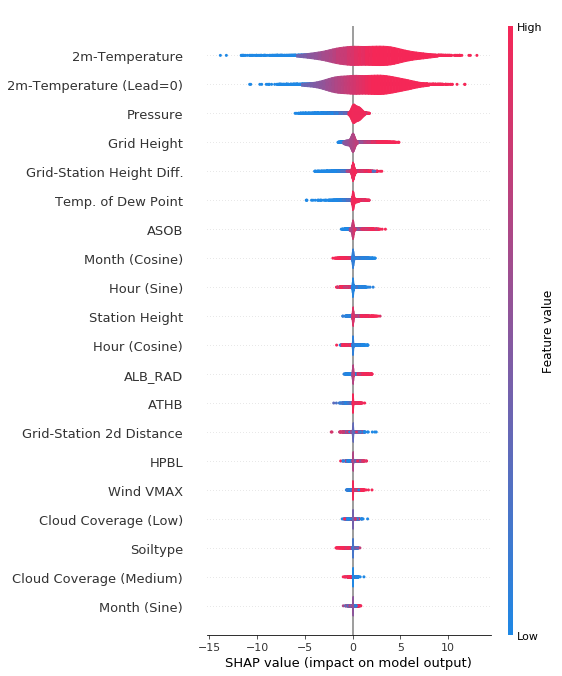

In [200]:
shap.summary_plot(all_data_shap_values[0], shap_test_data, plot_type=plot_type)

# Experiment with Summer/Winter and Night/Afternoon data

### Prepare data winter/night

In [201]:
# fix seed to randomly sample 1000 samples from ~1M train points
seed = 17257
# select points in january and july from training set to train explanation model
jan_night_train_data_set = train_data[train_data['Init'].str.contains('..01..03')]
jan_nigh_test_data_set = test_data[test_data['Init'].str.contains('..01..03')]

In [202]:
#explanation_training_set = jan_train_data_set.sample(n=100000, random_state=seed)
explanation_training_set = jan_night_train_data_set
explanation_training_data = explanation_training_set.iloc[:,2:-1]
# select randomly test points from test set to calculate SHAP values
shap_test_set = jan_nigh_test_data_set
shap_test_data = shap_test_set.iloc[:,2:-1]

In [22]:
start = time()
dense_train_data = shap.kmeans(explanation_training_data, 200)
print("Run Time for KMeans: %ss" % str(time() - start))

Run Time for KMeans: 6.490294694900513s


In [23]:
explainer = shap.KernelExplainer(f, dense_train_data)

Using 200 background data samples could cause slower run times. Consider using shap.kmeans(data, K) to summarize the background as K weighted samples.


In [203]:
if load_existing:
    with open('/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/knn_1/shap/shap_values_january_night_k_200_nsamples_150.pkl','rb') as handle:
        shap_values_jan_night = pkl.load(handle)    
else:
    shap_values_jan_night = explainer.shap_values(shap_test_data, nsamples=150)

In [25]:
if not load_existing:
    with open('/home/ninow/master_thesis/code/project/results/runs/knn_1/shap/shap_values_january_night_k_200_nsamples_150.pkl','wb') as handle:
        pkl.dump(shap_values_jan_night, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [92]:
shap.force_plot(shap_values_jan_night[0][4], shap_test_data.iloc[0,:])

In [93]:
shap.force_plot(shap_values_jan_night[0], shap_test_data)

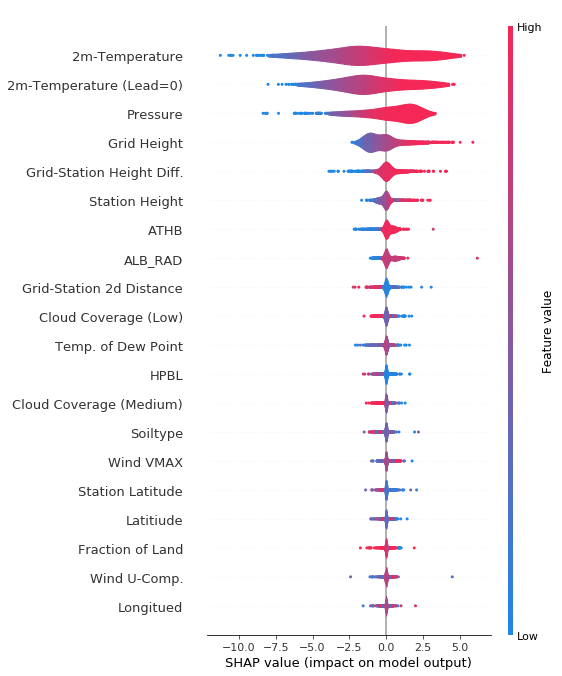

In [204]:
shap.summary_plot(shap_values_jan_night[0], shap_test_data, plot_type=plot_type)

### Prepare data winter/afternoon

In [205]:
# fix seed to randomly sample 1000 samples from ~1M train points
seed = 17257
# select points in january and july from training set to train explanation model
jan_afternoon_train_data_set = train_data[train_data['Init'].str.contains('..01..15')]
jan_afternoon_test_data_set = test_data[test_data['Init'].str.contains('..01..15')]

In [206]:
#explanation_training_set = jan_train_data_set.sample(n=100000, random_state=seed)
explanation_training_set = jan_afternoon_train_data_set
explanation_training_data = explanation_training_set.iloc[:,2:-1]
# select randomly test points from test set to calculate SHAP values
shap_test_set = jan_afternoon_test_data_set
shap_test_data = shap_test_set.iloc[:,2:-1]

In [32]:
start = time()
dense_train_data = shap.kmeans(explanation_training_data, 200)
print("Run Time for KMeans: %ss" % str(time() - start))

Run Time for KMeans: 7.304132699966431s


In [33]:
explainer = shap.KernelExplainer(f, dense_train_data)

Using 200 background data samples could cause slower run times. Consider using shap.kmeans(data, K) to summarize the background as K weighted samples.


In [207]:
if load_existing:
    with open('/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/knn_1/shap/shap_values_january_afternoon_k_200_nsamples_150.pkl','rb') as handle:
        shap_values_jan_afternoon = pkl.load(handle)    
else:
    shap_values_jan_afternoon = explainer.shap_values(shap_test_data, nsamples=150)

In [35]:
with open('/home/ninow/master_thesis/code/project/results/runs/knn_1/shap/shap_values_january_afternoon_k_200_nsamples_150.pkl','wb') as handle:
    pkl.dump(shap_values_jan_afternoon, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [98]:
shap.force_plot(shap_values_jan_afternoon[0][4], shap_test_data.iloc[0,:])

In [99]:
shap.force_plot(shap_values_jan_afternoon[0], shap_test_data)

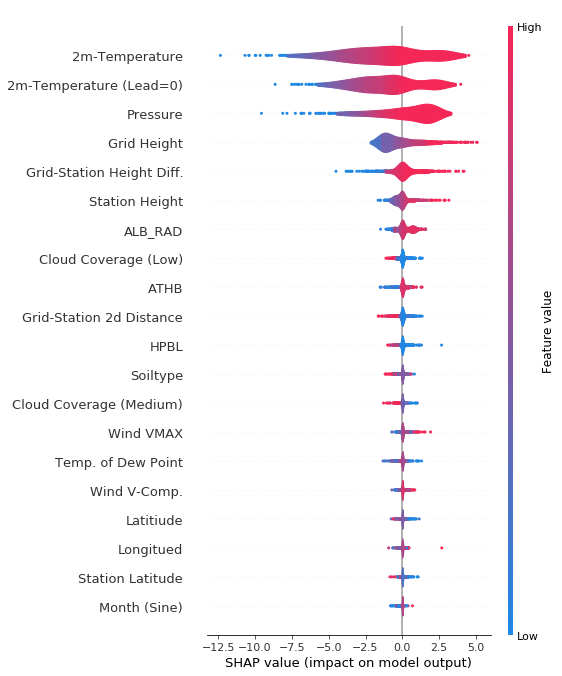

In [208]:
shap.summary_plot(shap_values_jan_afternoon[0], shap_test_data, plot_type=plot_type)

### Prepare data summer/night

In [209]:
# fix seed to randomly sample 1000 samples from ~1M train points
seed = 17257
# select points in january and july from training set to train explanation model
july_night_train_data_set = train_data[train_data['Init'].str.contains('..07..03')]
july_nigh_test_data_set = test_data[test_data['Init'].str.contains('..07..03')]

In [210]:
#explanation_training_set = jan_train_data_set.sample(n=100000, random_state=seed)
explanation_training_set = july_night_train_data_set
explanation_training_data = explanation_training_set.iloc[:,2:-1]
# select randomly test points from test set to calculate SHAP values
shap_test_set = july_nigh_test_data_set
shap_test_data = shap_test_set.iloc[:,2:-1]

In [41]:
start = time()
dense_train_data = shap.kmeans(explanation_training_data, 200)
print("Run Time for KMeans: %ss" % str(time() - start))

Run Time for KMeans: 3.682520627975464s


In [42]:
explainer = shap.KernelExplainer(f, dense_train_data)

Using 200 background data samples could cause slower run times. Consider using shap.kmeans(data, K) to summarize the background as K weighted samples.


In [211]:
if load_existing:
    with open('/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/knn_1/shap/shap_values_july_night_k_200_nsamples_150.pkl','rb') as handle:
        shap_values_july_night = pkl.load(handle)    
else:
    shap_values_july_night = explainer.shap_values(shap_test_data, nsamples=150)

In [44]:
if not load_existing:
    with open('/home/ninow/master_thesis/code/project/results/runs/knn_1/shap/shap_values_july_night_k_200_nsamples_150.pkl','wb') as handle:
        pkl.dump(shap_values_july_night, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [102]:
shap.force_plot(shap_values_july_night[0][4], shap_test_data.iloc[0,:])

In [108]:
shap.force_plot(shap_values_july_night[0], shap_test_data)

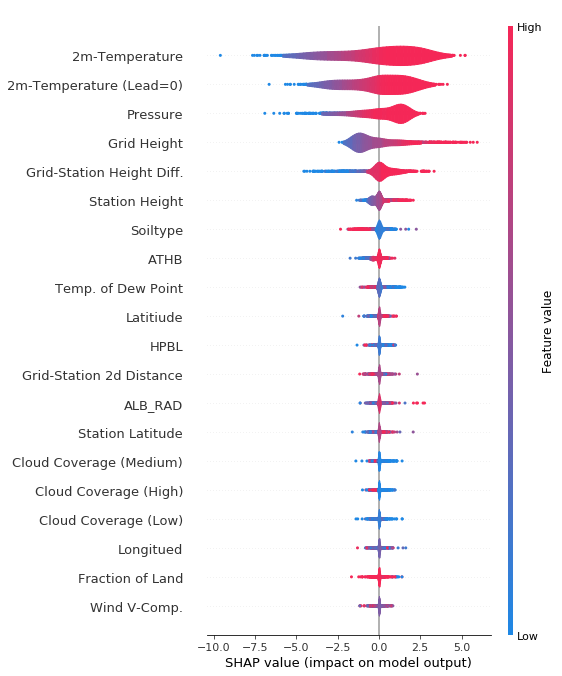

In [213]:
shap.summary_plot(shap_values_july_night[0], shap_test_data, plot_type=plot_type)

### Prepare data summer/afternoon

In [214]:
# fix seed to randomly sample 1000 samples from ~1M train points
seed = 17257
# select points in january and july from training set to train explanation model
july_afternoon_train_data_set = train_data[train_data['Init'].str.contains('..07..15')]
july_afternoon_test_data_set = test_data[test_data['Init'].str.contains('..07..15')]

In [215]:
#explanation_training_set = jan_train_data_set.sample(n=100000, random_state=seed)
explanation_training_set = july_afternoon_train_data_set
explanation_training_data = explanation_training_set.iloc[:,2:-1]
# select randomly test points from test set to calculate SHAP values
shap_test_set = july_afternoon_test_data_set
shap_test_data = shap_test_set.iloc[:,2:-1]

In [50]:
start = time()
dense_train_data = shap.kmeans(explanation_training_data, 200)
print("Run Time for KMeans: %ss" % str(time() - start))

Run Time for KMeans: 4.437402248382568s


In [51]:
explainer = shap.KernelExplainer(f, dense_train_data)

Using 200 background data samples could cause slower run times. Consider using shap.kmeans(data, K) to summarize the background as K weighted samples.


In [216]:
if load_existing:
    with open('/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/knn_1/shap/shap_values_july_afternoon_k_200_nsamples_150.pkl','rb') as handle:
        shap_values_july_afternoon = pkl.load(handle)    
else:
    shap_values_july_afternoon = explainer.shap_values(shap_test_data, nsamples=150)

In [53]:
if not load_existing:
    with open('/home/ninow/master_thesis/code/project/results/runs/knn_1/shap/shap_values_july_afternoon_k_200_nsamples_150.pkl','wb') as handle:
        pkl.dump(shap_values_july_afternoon, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [113]:
shap.force_plot(shap_values_july_afternoon[0][4], shap_test_data.iloc[0,:])

In [114]:
shap.force_plot(shap_values_july_afternoon[0], shap_test_data)

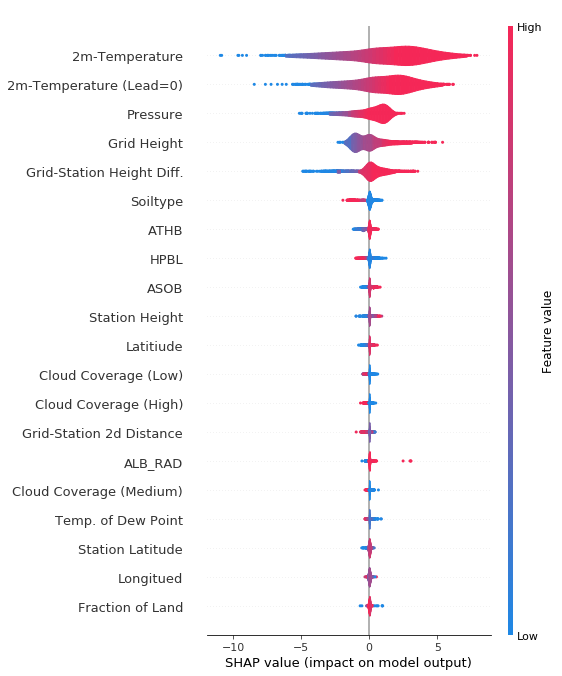

In [217]:
shap.summary_plot(shap_values_july_afternoon[0], shap_test_data, plot_type=plot_type)

### Get for each (Month/Time) type a vector with the rank of each feature

In [375]:
feature_rank_january_night = getImportanceIdxByFeature(shap_values_jan_night[0], test_data.columns)
feature_rank_january_afternoon = getImportanceIdxByFeature(shap_values_jan_afternoon[0], test_data.columns)
feature_rank_july_night = getImportanceIdxByFeature(shap_values_july_night[0], test_data.columns)
feature_rank_july_afternoon = getImportanceIdxByFeature(shap_values_july_afternoon[0], test_data.columns)

In [381]:
(feature_rank_january_night-feature_rank_january_afternoon).values

array([[ 0, -5,  7,  1,  0, -4,  0,  0,  2, -1,  1,  1, -2,  1,  0,  0,
         0, -4,  2,  0,  2, -1,  0, -3, -3,  0, -1,  3,  4,  0]])

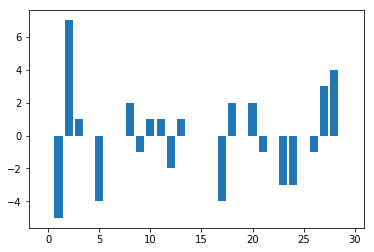

In [386]:
plt.bar(np.arange(0,30),(feature_rank_january_night-feature_rank_january_afternoon).values[0])
plt.show()

In [409]:
mean_absolute_feature_importance_january_night = getMeanAbsoluteImportanceByFeature(shap_values_jan_night[0], test_data.columns)
mean_absolute_feature_importance_january_afternoon = getMeanAbsoluteImportanceByFeature(shap_values_jan_afternoon[0], test_data.columns)
mean_absolute_feature_importance_july_night = getMeanAbsoluteImportanceByFeature(shap_values_july_night[0], test_data.columns)
mean_absolute_feature_importance_july_afternoon = getMeanAbsoluteImportanceByFeature(shap_values_july_afternoon[0], test_data.columns)

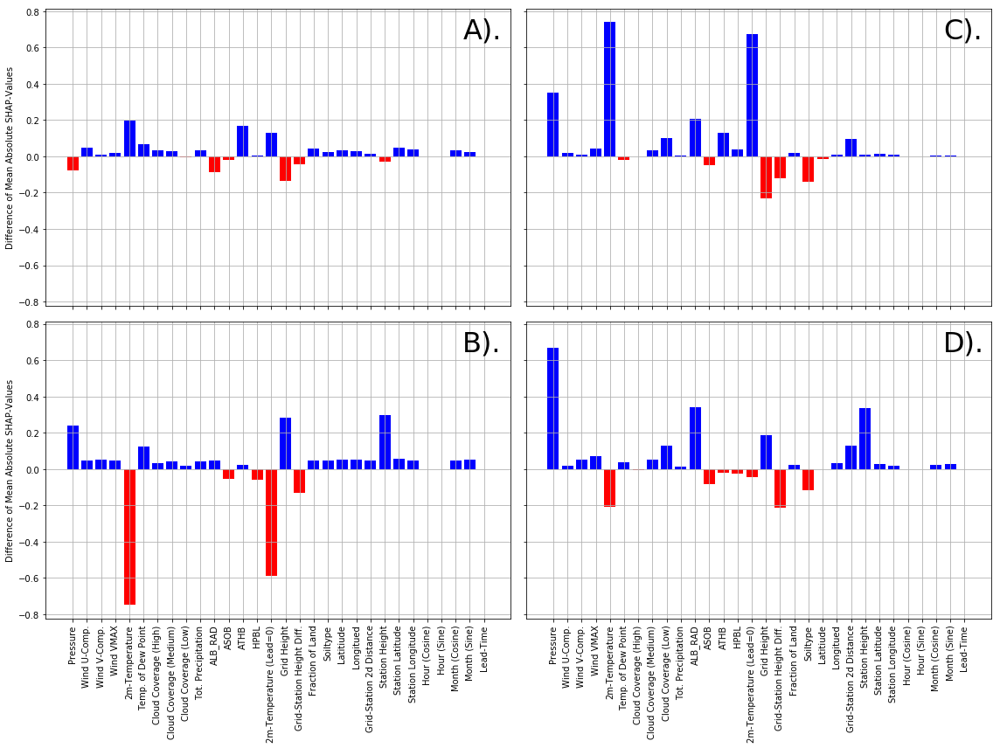

In [460]:
feature_importance_difference_january_diurnal = (feature_importance_january_night-feature_importance_january_afternoon).values[0]
feature_importance_difference_july_diurnal = (feature_importance_july_night-feature_importance_july_afternoon).values[0]
feature_importance_difference_night_seasonal = (feature_importance_january_night-feature_importance_july_night).values[0]
feature_importance_difference_afternoon_seasonal = (feature_importance_january_afternoon-feature_importance_july_afternoon).values[0]


fig, ax = plt.subplots(2,2, figsize=(16,12), sharex=True, sharey=True)
plt.rcParams['axes.grid'] = True
plt.xticks(np.arange(0,30), rotation='vertical')
for idx, feature_importance_difference in enumerate([feature_importance_difference_january_diurnal, feature_importance_difference_july_diurnal, feature_importance_difference_night_seasonal, feature_importance_difference_afternoon_seasonal]):
    colors = ["r" if i < 0 else "b" for i in feature_importance_difference]
    ax[idx%2, idx//2].bar(np.arange(0,30), feature_importance_difference, color=colors)
    
for axis in fig.axes:
    plt.sca(axis)
    plt.xticks(rotation=90)
    
for idx, letter in enumerate(['A', 'B', 'C', 'D']):
    ax[idx%2, idx//2].text(27.5, 0.65, "%s)." % letter, fontsize=32)
    
ax[1,0].set_xticklabels(test_data.columns[2:-1])
ax[1,1].set_xticklabels(test_data.columns[2:-1])

ax[0,0].set_ylabel('Difference of Mean Absolute SHAP-Values')
ax[1,0].set_ylabel('Difference of Mean Absolute SHAP-Values')
fig.tight_layout()
plt.show()

In [422]:
ax[0]

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f731dfa2208>,
      dtype=object)

# Experiment with La Brévine (high diurnal effect (cosine))

### Prepare data La Brévine

In [218]:
# fix seed to randomly sample 1000 samples from ~1M train points
seed = 17257
# select points in january and july from training set to train explanation model
brevine_train_data_set = train_data[train_data['Station'] == 852]
brevine_test_data_set = test_data[test_data['Station'] == 852]

In [219]:
#explanation_training_set = jan_train_data_set.sample(n=100000, random_state=seed)
explanation_training_set = brevine_train_data_set
explanation_training_data = explanation_training_set.iloc[:,2:-1]
# select randomly test points from test set to calculate SHAP values
shap_test_set = brevine_test_data_set
shap_test_data = shap_test_set.iloc[:,2:-1]

In [ ]:
start = time()
dense_train_data = shap.kmeans(explanation_training_data, 200)
print("Run Time for KMeans: %ss" % str(time() - start))

In [ ]:
explainer = shap.KernelExplainer(f, dense_train_data)

In [220]:
if load_existing:
    with open('/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/knn_1/shap/station_shap_values/shap_values_brevine_k_200_nsamples_150.pkl','rb') as handle:
        shap_values_brevine = pkl.load(handle)    
else:
    shap_values_brevine = explainer.shap_values(shap_test_data, nsamples=150)

In [ ]:
if not load_existing:
    with open('/home/ninow/master_thesis/code/project/results/runs/knn_1/shap/shap_values_brevine_k_200_nsamples_150.pkl','wb') as handle:
        pkl.dump(shap_values_brevine, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [120]:
shap.force_plot(shap_values_brevine[0][4], shap_test_data.iloc[0,:])

In [121]:
shap.force_plot(shap_values_brevine[0], shap_test_data)

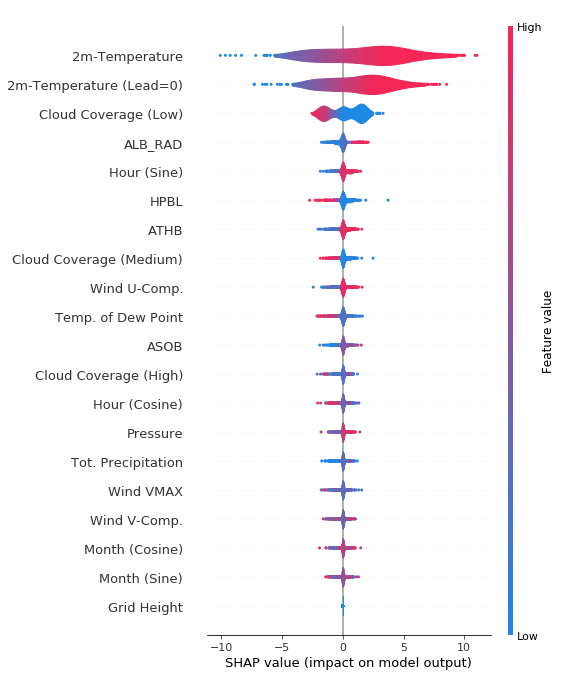

In [221]:
shap.summary_plot(shap_values_brevine[0], shap_test_data, plot_type=plot_type)

# Experiment with Mottec (high diurnal error (-cosine))

### Prepare data Mottec

In [222]:
# fix seed to randomly sample 1000 samples from ~1M train points
seed = 17257
# get station_id for mottec (statin_idx = 103)
mottec_id = stations[103].item()
# select points in january and july from training set to train explanation model
mottec_train_data_set = train_data[train_data['Station'] == mottec_id]
mottec_test_data_set = test_data[test_data['Station'] == mottec_id]

In [223]:
#explanation_training_set = jan_train_data_set.sample(n=100000, random_state=seed)
explanation_training_set = mottec_train_data_set
explanation_training_data = explanation_training_set.iloc[:,2:-1]
# select randomly test points from test set to calculate SHAP values
shap_test_set = mottec_test_data_set
shap_test_data = shap_test_set.iloc[:,2:-1]

In [ ]:
dense_train_data = shap.kmeans(explanation_training_data, 200)

In [ ]:
explainer = shap.KernelExplainer(f, dense_train_data)

In [224]:
if load_existing:
    with open('/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/knn_1/shap/station_shap_values/shap_values_mottec_k_200_nsamples_150.pkl','rb') as handle:
        shap_values_mottec = pkl.load(handle)    
else:
    shap_values_mottec = explainer.shap_values(shap_test_data, nsamples=150)

In [ ]:
if not load_existing:
    with open('/home/ninow/master_thesis/code/project/results/runs/knn_1/shap/shap_values_mottec_k_200_nsamples_150.pkl','wb') as handle:
        pkl.dump(shap_values_mottec, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [126]:
shap.force_plot(shap_values_mottec[0][4], shap_test_data.iloc[0,:])

In [127]:
shap.force_plot(shap_values_mottec[0], shap_test_data)

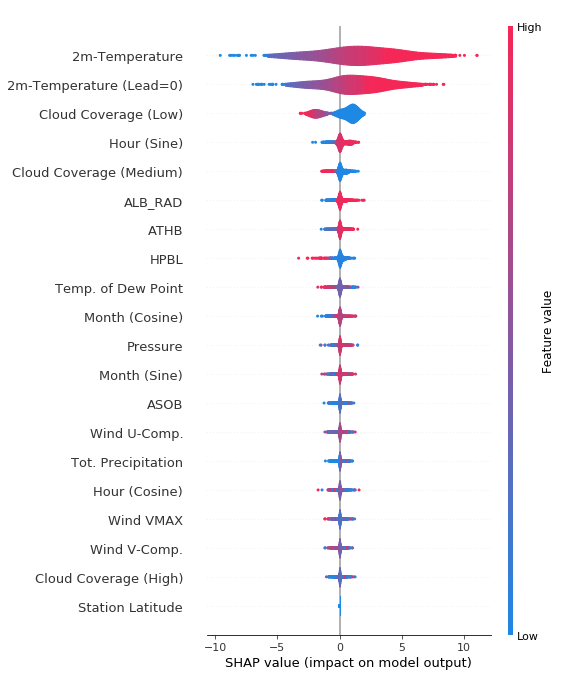

In [225]:
shap.summary_plot(shap_values_mottec[0], shap_test_data, plot_type=plot_type)

# Experiment with Lachen / Galgenen (low diurnal error)

### Prepare data Lachen / Galgenen

In [226]:
# fix seed to randomly sample 1000 samples from ~1M train points
seed = 17257
# get station_id for Lachen / Galgenen (statin_idx = 114 )
lachen_galgen_id = stations[114].item()
# select points in january and july from training set to train explanation model
lachen_galgen_train_set = train_data[train_data['Station'] == lachen_galgen_id]
lachen_galgen_test_set = test_data[test_data['Station'] == lachen_galgen_id]

In [227]:
#explanation_training_set = jan_train_data_set.sample(n=100000, random_state=seed)
explanation_training_set = lachen_galgen_train_set
explanation_training_data = explanation_training_set.iloc[:,2:-1]
# select randomly test points from test set to calculate SHAP values
shap_test_set = lachen_galgen_test_set
shap_test_data = shap_test_set.iloc[:,2:-1]

In [ ]:
dense_train_data = shap.kmeans(explanation_training_data, 200)

In [ ]:
explainer = shap.KernelExplainer(f, dense_train_data)

In [228]:
if load_existing:
    with open('/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/knn_1/shap/station_shap_values/shap_values_lachen_galgen_k_200_nsamples_150.pkl','rb') as handle:
        shap_values_lachen_galgen = pkl.load(handle)    
else:
    shap_values_lachen_galgen = explainer.shap_values(shap_test_data, nsamples=150)

In [ ]:
if not load_existing:
    with open('/home/ninow/master_thesis/code/project/results/runs/knn_1/shap/shap_values_lachen_galgen_k_200_nsamples_150.pkl','wb') as handle:
        pkl.dump(shap_values_lachen_galgen, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [132]:
shap.force_plot(shap_values_lachen_galgen[0][4], shap_test_data.iloc[0,:])

In [133]:
shap.force_plot(shap_values_lachen_galgen[0], shap_test_data)

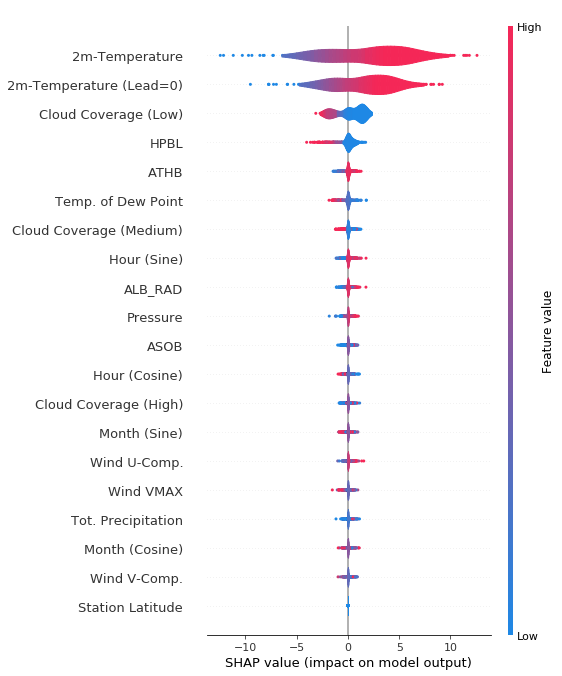

In [229]:
shap.summary_plot(shap_values_lachen_galgen[0], shap_test_data, plot_type=plot_type)

# Experiment with Grimsel Hospitz (best forecast skill, 65%)

### Prepare data Grimsel Hospitz

In [230]:
# fix seed to randomly sample 1000 samples from ~1M train points
seed = 17257
# get station_id for Grimsel Hospitz (statin_idx = 83 )
grimsel_id = stations[83].item()
print(grimsel_id)
# select points in january and july from training set to train explanation model
grimsel_train_set = train_data[train_data['Station'] == grimsel_id]
grimsel_test_set = test_data[test_data['Station'] == grimsel_id]

91


In [231]:
#explanation_training_set = jan_train_data_set.sample(n=100000, random_state=seed)
explanation_training_set = grimsel_train_set
explanation_training_data = explanation_training_set.iloc[:,2:-1]
# select randomly test points from test set to calculate SHAP values
shap_test_set = grimsel_test_set
shap_test_data = shap_test_set.iloc[:,2:-1]

In [ ]:
dense_train_data = shap.kmeans(explanation_training_data, 200)

In [ ]:
explainer = shap.KernelExplainer(f, dense_train_data)

In [232]:
if load_existing:
    with open('/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/knn_1/shap/station_shap_values/shap_values_grimsel_k_200_nsamples_150.pkl','rb') as handle:
        shap_values_grimsel = pkl.load(handle)    
else:
    shap_values_grimsel = explainer.shap_values(shap_test_data, nsamples=150)

In [ ]:
if not load_existing:
    with open('/home/ninow/master_thesis/code/project/results/runs/knn_1/shap/shap_values_grimsel_k_200_nsamples_150.pkl','wb') as handle:
        pkl.dump(shap_values_grimsel, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [138]:
shap.force_plot(shap_values_grimsel[0][4], shap_test_data.iloc[0,:])

In [139]:
shap.force_plot(shap_values_grimsel[0], shap_test_data)

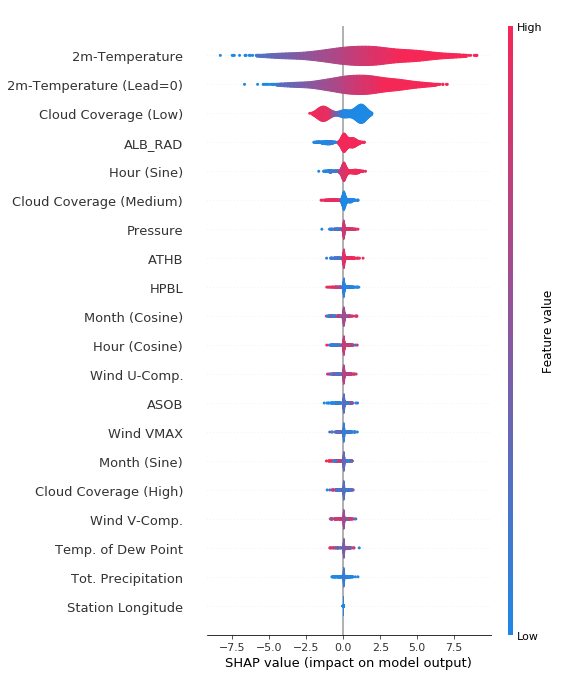

In [233]:
shap.summary_plot(shap_values_grimsel[0], shap_test_data, plot_type=plot_type)

# Experiment with complete Grid (16061903)

### We see that water has feature value "Soiltype == 1.0"

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:2: FutureWarning: reshape is deprecated and will raise in a subsequent release. Please use .values.reshape(...) instead
  


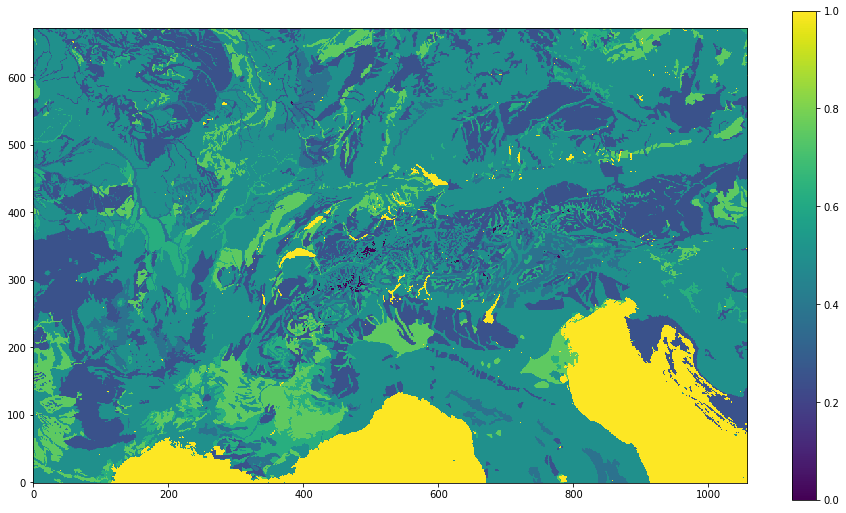

In [33]:
plt.figure(figsize=(16,9))
plt.imshow(complete_grid_data_set['Soiltype'].reshape((674,1058)))
plt.colorbar()
plt.gca().invert_yaxis()
plt.show()

#### Split train test set to water and not water

In [183]:
# select points in january and july from training set to train explanation model
no_water_train_set = complete_grid_data_set[complete_grid_data_set['Soiltype'] < 1]
water_test_set = complete_grid_data_set[complete_grid_data_set['Soiltype'] == 1.0]

In [184]:
# fix seed to randomly sample 1000 samples from ~1M train points
seed = 17257
# training points to be used in K-means generating reference values
explanation_training_set = no_water_train_set
explanation_training_data = explanation_training_set


In [185]:
# test points to calculate SHAP values
shap_test_set = water_test_set.sample(n=1000, random_state=seed)
shap_test_data = shap_test_set

In [186]:
start = time()
dense_train_data = shap.kmeans(explanation_training_data, 200)
print("Run Time for KMeans: %ss" % str(time() - start))

Run Time for KMeans: 3913.1775844097137s


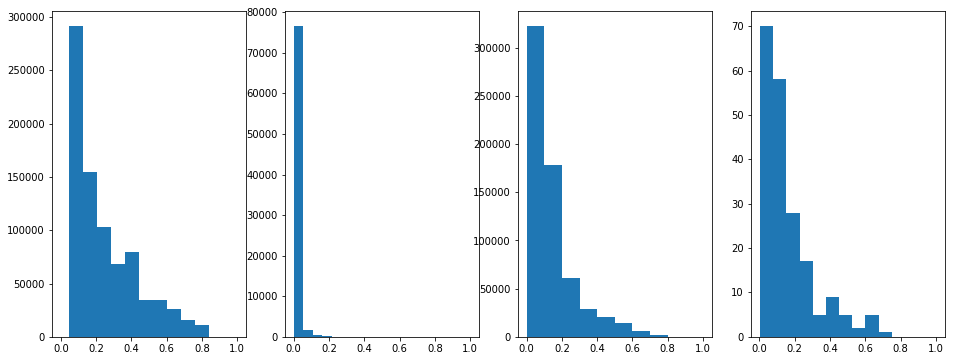

In [262]:
feature = 'Station Height'

fig, ax = plt.subplots(1,4, figsize=(16,6), sharex=True)
ax[0].hist(train_data[feature])
ax[1].hist(water_test_set[feature])
ax[2].hist(no_water_train_set[feature])
ax[3].hist(pd.DataFrame(data=dense_train_data.data, columns=test_data.columns[2:-1])[feature])
plt.show()

In [ ]:
set(train_data['Grid Height']), set(water_test_set['Grid Height']), set(no_water_train_set['Grid Height'])

In [254]:
train_data['Grid Height']

0         0.101786
1         0.117349
2         0.091956
3         0.162634
4         0.351470
5         0.345882
6         0.350563
7         0.086193
8         0.421738
9         0.156198
10        0.251391
11        0.383181
12        0.091956
13        0.412582
14        0.118051
15        0.611451
16        0.112113
17        0.384790
18        0.465912
19        0.112113
20        0.465912
21        0.110972
22        0.182995
23        0.200226
24        0.257008
25        0.509881
26        0.175477
27        0.551861
28        0.100967
29        0.594191
            ...   
819492    0.218481
819493    0.412582
819494    0.215701
819495    0.166964
819496    0.349568
819497    0.110972
819498    0.257008
819499    0.347550
819500    0.134550
819501    0.477467
819502    0.092366
819503    0.080518
819504    0.162634
819505    0.080518
819506    0.351470
819507    0.169100
819508    0.412582
819509    0.413927
819510    0.100762
819511    0.343279
819512    0.101786
819513    0.

In [252]:
set(pd.DataFrame(data=dense_train_data.data, columns=test_data.columns[2:-1])['Grid Height'])

{0.0036674229807292266,
 0.01835299929806071,
 0.021424683634225842,
 0.021951258091854154,
 0.02203902050145887,
 0.023326202508994736,
 0.024905925881879662,
 0.027831339535370266,
 0.028182389173789138,
 0.028299405719928762,
 0.028562692948742918,
 0.028679709494882542,
 0.029235538089045755,
 0.030200924594697656,
 0.03052272009658162,
 0.031868412162718095,
 0.03292156107797471,
 0.033916201720161514,
 0.03415023481244076,
 0.03491084236234832,
 0.03596399127760494,
 0.03856760942921158,
 0.03900642147723517,
 0.03956225007139838,
 0.0401473328020965,
 0.042487663724888984,
 0.04295572990944748,
 0.04418440364391354,
 0.044242911916983346,
 0.04474023223807675,
 0.045062027739960715,
 0.0469342924781947,
 0.047285342116613574,
 0.0483677451684051,
 0.04874804894335888,
 0.053809014563897625,
 0.055856804121341044,
 0.05696846130966748,
 0.057202494401946725,
 0.057846085405714655,
 0.059250283959390145,
 0.05977685841701846,
 0.059835366690088265,
 0.06027417873811185,
 0.0610055

In [189]:
explainer = shap.KernelExplainer(f, dense_train_data)

Using 200 background data samples could cause slower run times. Consider using shap.kmeans(data, K) to summarize the background as K weighted samples.


In [190]:
load_existing = False
if load_existing:
    with open('/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/knn_1/shap/shap_values_water_test_1000_k_200_nsamples_150_corrected.pkl','rb') as handle:
        shap_values_water = pkl.load(handle)    
else:
    shap_values_water = explainer.shap_values(shap_test_data, nsamples=150)
load_existing = True


 30%|███       | 303/1000 [08:47<20:13,  1.74s/it]


 60%|██████    | 605/1000 [17:35<11:29,  1.74s/it]


 91%|█████████ | 907/1000 [26:20<02:42,  1.74s/it]


100%|██████████| 1000/1000 [29:01<00:00,  1.74s/it]


In [191]:
with open('/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/knn_1/shap/shap_values_water_test_1000_k_200_nsamples_150.pkl','wb') as handle:
    pkl.dump(shap_values_water, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [286]:
shap.force_plot(shap_values_water[0][5], shap_test_data.iloc[0,:])

In [193]:
shap.force_plot(shap_values_water[0], shap_test_data)

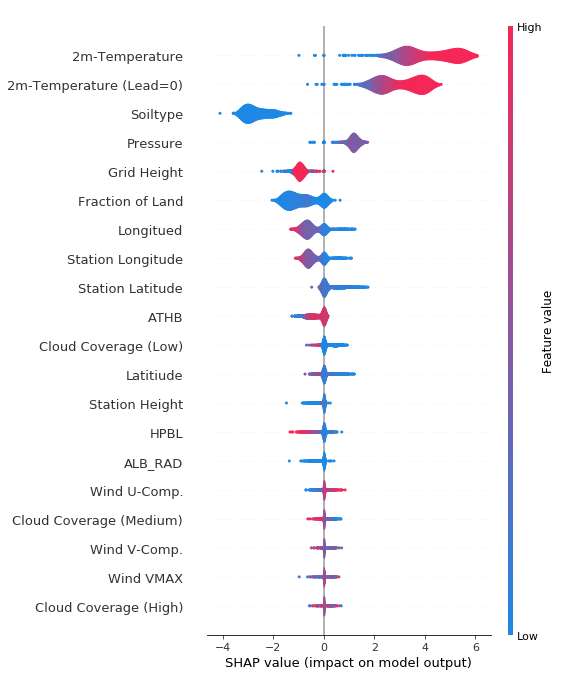

In [194]:
shap.summary_plot(shap_values_water[0], shap_test_data, plot_type='violin')

(720, 30)

### Load and dump calculated SHAP-values

In [ ]:
with open('/home/ninow/master_thesis/code/project/results/runs/knn_1/shap/shap_values_train_50000_test_1000_permutation_150.pkl','wb') as handle:
    pkl.dump(shap_values, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [ ]:
with open('/home/ninow/master_thesis/code/project/results/runs/plot_run_error_over_time/shap/shap_values.pkl','rb') as handle:
    shap_values = pkl.load(handle)

In [142]:
train_data_set

NameError: name 'train_data_set' is not defined

# Feature Interpretation of Error Prediction

# Experiment with all data

### Prepare data

In [17]:
# fix seed to randomly sample 1000 samples from ~1M train points
seed = 17257
# select randomly points from training set to train explanation model
#explanation_training_set = train_data.sample(n=100000, random_state=seed)
explanation_training_set = train_data
explanation_training_data = explanation_training_set.iloc[:,2:-2]


In [18]:
# select randomly test points from test set to calculate SHAP values
shap_test_set = test_data.sample(n=5000, random_state=seed)
shap_test_data = shap_test_set.iloc[:,2:-2]

In [20]:
start = time()
dense_train_data = shap.kmeans(explanation_training_data, 200)
print("Run Time for KMeans: %ss" % str(time() - start))

Run Time for KMeans: 4365.447658061981s


In [22]:
explainer = shap.KernelExplainer(f, dense_train_data)

Using 200 background data samples could cause slower run times. Consider using shap.kmeans(data, K) to summarize the background as K weighted samples.


In [23]:
if load_existing:
    with open('/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/knn_1/shap/shap_values_all_train_error_prediction_k_200_test_5000_nsamples_150.pkl','rb') as handle:
        all_data_shap_values = pkl.load(handle)
else:
    all_data_shap_values = explainer.shap_values(shap_test_data, nsamples=150)

In [25]:
if not load_existing:
    with open('/mnt/ds3lab-scratch/ninow/final_results/network/model_predictions/knn_1/shap/shap_values_all_train_error_prediction_k_200_test_5000_nsamples_150.pkl','wb') as handle:
        pkl.dump(all_data_shap_values, handle, protocol=pkl.HIGHEST_PROTOCOL)

In [24]:
shap.force_plot(all_data_shap_values[0][4], shap_test_data.iloc[0,:])

In [25]:
shap.force_plot(all_data_shap_values[0], shap_test_data)

/home/ninow/.local/lib/python3.5/site-packages/shap/plots.py:693: UserWarning: shap.force_plot is slow many thousands of rows, try subsampling your data.
  warnings.warn("shap.force_plot is slow many thousands of rows, try subsampling your data.")
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


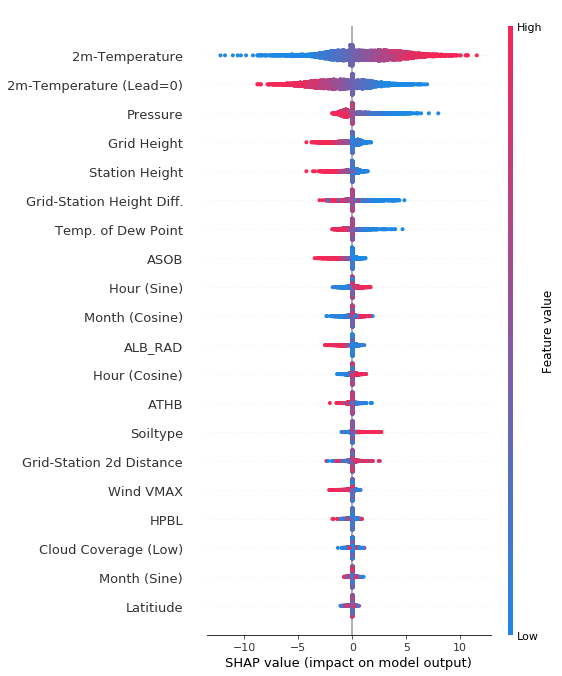

In [26]:
shap.summary_plot(all_data_shap_values[0], shap_test_data, plot_type=plot_type)